<a href="https://colab.research.google.com/github/Rijalpratama23/PengolahanCitraDigital/blob/main/segmentasiCitra.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Metode Treshold (otak)

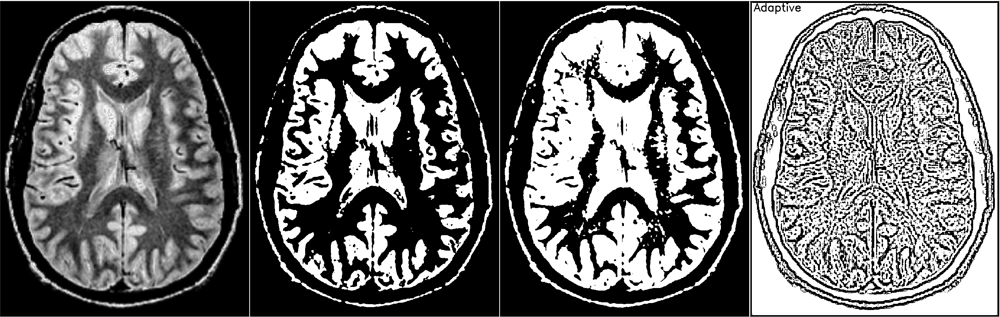

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


# Membaca citra dalam mode grayscale
img = cv2.imread('otak.jpg', 0)

# Menggunakan metode thresholding global
_, thresh = cv2.threshold(img, 130, 255, cv2.THRESH_BINARY)

#otsu
_, otsu = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

#adaptive thresh
adaptive_thresh = cv2.adaptiveThreshold(
    img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY, 11, 2
)




cv2.putText(img, 'Original', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
cv2.putText(thresh, 'Thresholding', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
cv2.putText(otsu, 'Otsu', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
cv2.putText(adaptive_thresh, 'Adaptive', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)

# Gabungkan dua gambar horizontal
combined = cv2.hconcat([img, thresh,otsu,adaptive_thresh])

# Menampilkan hasil
cv2_imshow(combined)

Edge-Based Segmentation (daun)

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


# Membaca citra dalam mode grayscale
img = cv2.imread('daun.jpg', 0)

# Menggunakan metode thresholding global
_, thresh = cv2.threshold(img, 130, 255, cv2.THRESH_BINARY)

#otsu
_, otsu = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

#adaptive thresh
adaptive_thresh = cv2.adaptiveThreshold(
    img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY, 11, 2
)




cv2.putText(img, 'Original', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
cv2.putText(thresh, 'Thresholding', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
cv2.putText(otsu, 'Otsu', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
cv2.putText(adaptive_thresh, 'Adaptive', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)

# Gabungkan dua gambar horizontal
combined = cv2.hconcat([img, thresh,otsu,adaptive_thresh])

# Menampilkan hasil
cv2_imshow(combined)

Region-Based Segmentation (apel)

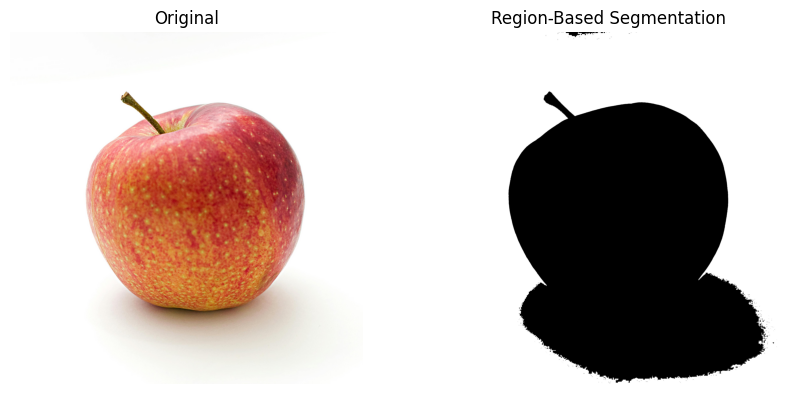

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Baca gambar dan ubah ke grayscale
img = cv2.imread('apel.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Tentukan titik awal (seed)
seed_point = (150, 150)  # misalnya koordinat tengah daun
threshold = 5  # toleransi kesamaan warna

# Inisialisasi
height, width = gray.shape
mask = np.zeros((height, width), np.uint8)
stack = [seed_point]
seed_value = gray[seed_point[1], seed_point[0]]

# Region growing loop
while len(stack) > 0:
    x, y = stack.pop()
    if mask[y, x] == 0:
        if abs(int(gray[y, x]) - int(seed_value)) < threshold:
            mask[y, x] = 255
            for nx in range(max(x-1,0), min(x+2,width)):
                for ny in range(max(y-1,0), min(y+2,height)):
                    if mask[ny, nx] == 0:
                        stack.append((nx, ny))

# Visualisasi hasil
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title('Original')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1,2,2)
plt.title('Region-Based Segmentation')
plt.imshow(mask, cmap='gray')
plt.axis('off')

plt.show()


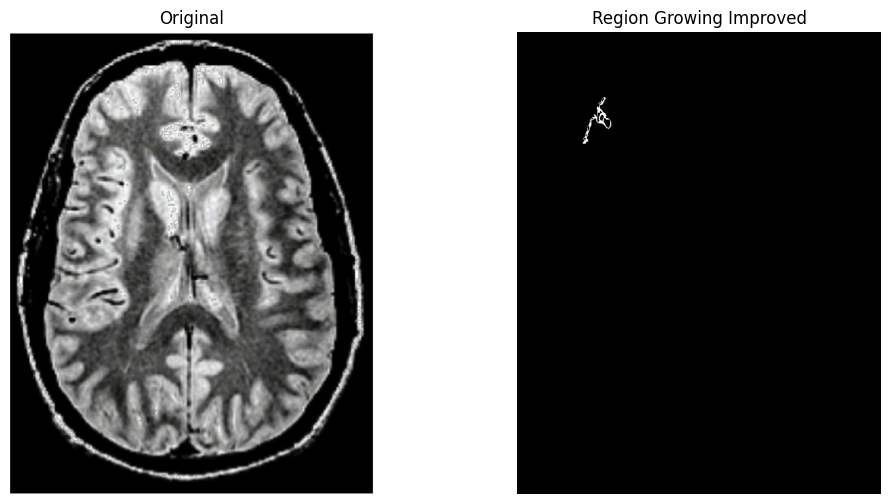

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import deque

# ==========================
# PRE-PROCESSING
# ==========================
img = cv2.imread('otak.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# (opsional) kurangi noise agar region growing lebih stabil
gray_blur = cv2.GaussianBlur(gray, (5,5), 0)

# ==========================
# PARAMETER
# ==========================
seed_point = (150, 150)   # pilih seed pada area tumor
threshold = 8             # toleransi intensitas
max_region_size = 200000  # safety bound agar tidak infinite expansion

# ==========================
# INISIALISASI
# ==========================
h, w = gray_blur.shape
mask = np.zeros((h, w), np.uint8)
visited = np.zeros((h, w), np.bool_)
queue = deque()

queue.append(seed_point)

seed_value = int(gray_blur[seed_point[1], seed_point[0]])

region_values = [seed_value]  # untuk adaptive threshold

# ==========================
# REGION GROWING LOOP
# ==========================
while queue:
    x, y = queue.popleft()

    # skip jika sudah diproses
    if visited[y, x]:
        continue
    visited[y, x] = True

    # cek intensitas
    current_val = int(gray_blur[y, x])
    region_mean = np.mean(region_values)

    if abs(current_val - region_mean) < threshold:
        mask[y, x] = 255
        region_values.append(current_val)

        # Hindari region terlalu besar
        if len(region_values) > max_region_size:
            print("Region stopped because max size exceeded.")
            break

        # cek 8-neighbors
        for ny in range(y-1, y+2):
            for nx in range(x-1, x+2):
                if 0 <= nx < w and 0 <= ny < h:
                    if not visited[ny, nx]:
                        queue.append((nx, ny))

# ==========================
# VISUALISASI
# ==========================
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.title('Original')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1,2,2)
plt.title('Region Growing Improved')
plt.imshow(mask, cmap='gray')
plt.axis('off')

plt.show()
